# [AICE Professional 문제풀이 특강] (Image) Cats & Dogs 분류 예측
+ 본과정에서는 Cats & Dogs 이미지 데이터를 가지고 이미지 모델을 만들고
 분류 실습하겠습니다.
+ 첫번째로, 이미지 파일 읽고 , 라벨정보도 만들어 데이터셋을 생성하고
+ 만들어진 데이터셋을 활용하여 CNN 모델 학습하고 평가하겠습니다.
+ 두번째로, 이미지 파일 읽고, 라벨정보 만드는 작업을 Keras의 image_dataset_from_directory 함수 활용하여
+ 데이터셋을 만들고 CNN 모델 학습 및 평가 하겠습니다.
+ 세번째로, MobileNet Transfer Learning(전이학습)으로 모델 학습 및 평가 진행하겠습니다.

<br>
<br>
<br>

#   
# A. 리스트 이미지 데이터셋 만들기 + CNN 모델 만들기

#   
## 1.필요한 라이브러리 임포트

In [ ]:
import os
from glob import glob
from PIL import Image
import zipfile

import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt

#   
## 2.Cats & Dogs 데이터 이미지 파일 가져오기

In [ ]:
# 약 25000 장의 Cats & Dogs 데이터를 사용합니다.
# 아래 데이터 가져오기 그냥 사용합니다.

# !wget --no-check-certificate \
#     "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip" \
#     -O "/tmp/cats-and-dogs.zip"

# local_zip = '/tmp/cats-and-dogs.zip'
# zip_ref = zipfile.ZipFile(local_zip, 'r')
# zip_ref.extractall('/tmp')
# zip_ref.close()

# print(len(os.listdir('/tmp/PetImages/Cat/')))
# print(len(os.listdir('/tmp/PetImages/Dog/')))

In [ ]:
# Cats & Dogs 데이터 파일 다운로드
# train 폴더 : 2000개 데이터
# validation 폴더 : 1000개 데이터

!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip -q cats_and_dogs.zip

--2024-08-29 06:15:05--  https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip
Resolving cdn.freecodecamp.org (cdn.freecodecamp.org)... 172.67.70.149, 104.26.2.33, 104.26.3.33, ...
Connecting to cdn.freecodecamp.org (cdn.freecodecamp.org)|172.67.70.149|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70702765 (67M) [application/zip]
Saving to: ‘cats_and_dogs.zip’

cats_and_dogs.zip   100%[===================>]  67.43M  92.0MB/s    in 0.7s    

2024-08-29 06:15:06 (92.0 MB/s) - ‘cats_and_dogs.zip’ saved [70702765/70702765]



In [ ]:
# 이미지 폴더 밑의 폴더 확인

!ls -l cats_and_dogs

total 12
drwxr-xr-x 2 root root 4096 Jan  9  2020 test
drwxr-x--- 4 root root 4096 Jan  8  2020 train
drwxr-x--- 4 root root 4096 Jan  8  2020 validation


In [ ]:
# train 폴더 안의 이지미 갯수
!ls -l cats_and_dogs/train

total 80
drwxr-x--- 2 root root 36864 Sep 23  2016 cats
drwxr-x--- 2 root root 36864 Sep 23  2016 dogs


In [ ]:
# cats 폴더 안의 이지미 파일들
!ls -l cats_and_dogs/train/cats | grep jpg | head

-rw-r--r-- 1 root root 12414 Sep 20  2013 cat.0.jpg
-rw-r--r-- 1 root root 28377 Sep 20  2013 cat.100.jpg
-rw-r--r-- 1 root root 11291 Sep 20  2013 cat.101.jpg
-rw-r--r-- 1 root root 28635 Sep 20  2013 cat.102.jpg
-rw-r--r-- 1 root root 24853 Sep 20  2013 cat.103.jpg
-rw-r--r-- 1 root root 18941 Sep 20  2013 cat.104.jpg
-rw-r--r-- 1 root root  6159 Sep 20  2013 cat.105.jpg
-rw-r--r-- 1 root root 20232 Sep 20  2013 cat.106.jpg
-rw-r--r-- 1 root root 23076 Sep 20  2013 cat.107.jpg
-rw-r--r-- 1 root root 24431 Sep 20  2013 cat.108.jpg


In [ ]:
# cats 폴더 안의 이지미 파일 갯수
!ls -l cats_and_dogs/train/cats | grep jpg | wc -l

1000


#   
## 3. os.listdir과 PIL.Image 이용하여 이미지 읽기

In [ ]:
# 이미지 패스 지정
train_cat_path = 'cats_and_dogs/train/cats/'
train_dog_path = 'cats_and_dogs/train/dogs/'
valid_cat_path = 'cats_and_dogs/validation/cats/'
valid_dog_path = 'cats_and_dogs/validation/dogs/'

In [ ]:
# 이미지 패스의 파말 리스트 만들기
train_cat_file = os.listdir(train_cat_path)
train_dog_file = os.listdir(train_dog_path)
valid_cat_file = os.listdir(valid_cat_path)
valid_dog_file = os.listdir(valid_dog_path)

In [ ]:
# 이미지 파일 리스트 읽어보기
train_cat_file[:2], train_dog_file[:2]

(['cat.838.jpg', 'cat.912.jpg'], ['dog.459.jpg', 'dog.297.jpg'])

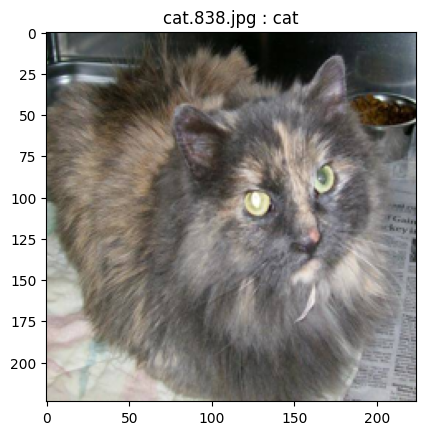

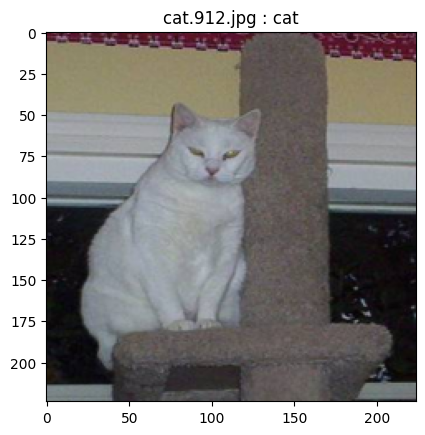

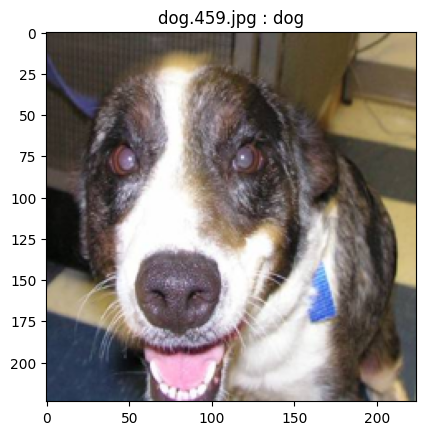

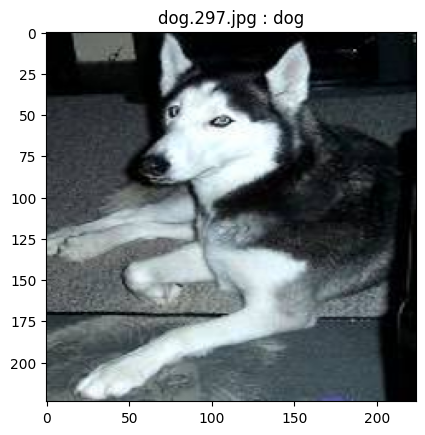

In [ ]:
# 위의 파일 리스트에서 2개씩 읽고 이미지 출력하기
for img_file in train_cat_file[:2] :
    img = Image.open(train_cat_path + img_file).resize((224,224))
    plt.title(img_file + ' : cat')
    plt.imshow(img)
    plt.show()

for img_file in train_dog_file[:2] :
    img = Image.open(train_dog_path + img_file).resize((224,224))
    plt.title(img_file + ' : dog')
    plt.imshow(img)
    plt.show()

#   
## 4. 이미지 라벨링 포함해서 Class별 이미지 리스트 만들기

In [ ]:
# Class 라벨 정의

class2idx = {'cat' :  0, 'dog' : 1}
idx2class = {0 : 'cat', 1 : 'dog'}


In [ ]:
# 수작업으로 이미지 리스트와 라벨 리스트 만들기

img_list = []
label_list = []

# Train 데이터를 img_list 리스트에 넣기
train_cat_file = glob(train_cat_path + '*.jpg')
for img_file in train_cat_file :
  img = Image.open(img_file).resize((128,128))
  img = np.array(img)/255.  # 이미지 스케일링
  img_list.append(img)
  label_list.append(0) # cat : 0

train_dog_file = glob(train_dog_path + '*.jpg')
for img_file in train_dog_file :
  img = Image.open(img_file).resize((128,128))
  img = np.array(img)/255.  # 이미지 스케일링
  img_list.append(img)
  label_list.append(1) # dog : 1


# Valid 데이터를 img_list 리스트에 넣기
valid_cat_file = glob(valid_cat_path + '*.jpg')
for img_file in valid_cat_file :
  img = Image.open(img_file).resize((128,128))
  img = np.array(img)/255.  # 이미지 스케일링
  img_list.append(img)
  label_list.append(0) # cat : 0

valid_dog_file = glob(valid_dog_path + '*.jpg')
for img_file in valid_dog_file :
  img = Image.open(img_file).resize((128,128))
  img = np.array(img)/255.  # 이미지 스케일링
  img_list.append(img)
  label_list.append(1) # dog : 1

In [ ]:
# 이미지 리스트, 라벨 리스트루 numpy array 변경
img_list_arr = np.array(img_list)
label_list_arr = np.array(label_list)

In [ ]:
# 이미지 리스트, 라벨 리스트 shape 확인
img_list_arr.shape, label_list_arr.shape

((3000, 128, 128, 3), (3000,))

#   
## 5. Train/Test 데이터셋 만들기

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test , y_train, y_test = train_test_split(img_list_arr, label_list_arr, test_size=0.3, stratify=label_list_arr, random_state=41)
X_train.shape, X_test.shape , y_train.shape, y_test.shape

((2100, 128, 128, 3), (900, 128, 128, 3), (2100,), (900,))

#   
## 6. CNN 모델

In [ ]:
# Hyperparameter Tunning

num_epochs = 10
batch_size = 32

learning_rate = 0.001
dropout_rate = 0.5

input_shape = (128, 128, 3)  # 사이즈 확인

In [ ]:
# Sequential 모델 정의
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D

model = Sequential()
model.add(Conv2D(32, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Conv2D(64,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(2, activation='softmax'))

In [ ]:
# 모델 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),  # Optimization
              loss='sparse_categorical_crossentropy',  # Loss Function
              metrics=['accuracy'])  # Metrics / Accuracy

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 128, 128, 32)        │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       8,388,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,409,922 (32.08 MB)

 Trainable params: 8,409,922 (32.08 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# callback : EarlyStopping, ModelCheckpoint

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# EarlyStopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)

# ModelCheckpoint
checkpoint_path = "my_checkpoint.keras"
checkpoint = ModelCheckpoint(filepath=checkpoint_path,
                             save_best_only=True,
                             monitor='val_loss',
                             verbose=1)


In [ ]:
# 모델 학습
# num_epochs = 10 ,  batch_size = 32
# 성능 70%

# 모델 학습(fit)
history = model.fit(
    X_train, y_train ,
    validation_data=(X_test, y_test),
    epochs=num_epochs,
    batch_size=batch_size,
    callbacks=[es, checkpoint]
)

Epoch 1/10
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4999 - loss: 1.6349
Epoch 1: val_loss improved from inf to 0.69147, saving model to my_checkpoint.keras
66/66 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - accuracy: 0.5000 - loss: 1.6246 - val_accuracy: 0.5056 - val_loss: 0.6915
Epoch 2/10
64/66 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5223 - loss: 0.6893
Epoch 2: val_loss improved from 0.69147 to 0.68865, saving model to my_checkpoint.keras
66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.5227 - loss: 0.6894 - val_accuracy: 0.4989 - val_loss: 0.6886
Epoch 3/10
63/66 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5534 - loss: 0.6841
Epoch 3: val_loss improved from 0.68865 to 0.65836, saving model to my_checkpoint.keras
66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.5544 - loss: 0.6837 - val_accuracy: 0.5956 - val_loss: 0.6584
Epoch 4/10
65/66 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.5843 - loss: 0.6682
Epoch 4: val_loss improved from 0.65836 to 0.64168

In [ ]:
# 모델을 딥하게 만들고 , epochs 늘려 다시 학습 수행
# Sequential 모델 정의

model = Sequential()
model.add(Conv2D(32, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Conv2D(64,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(64,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(128,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(2, activation='softmax'))

In [ ]:
# 모델 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),  # Optimization
              loss='sparse_categorical_crossentropy',  # Loss Function
              metrics=['accuracy'])  # Metrics / Accuracy

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 128, 128, 32)        │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 32, 32, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │       1,048,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,180,674 (4.50 MB)

 Trainable params: 1,180,674 (4.50 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# 모델 학습 : 딥하게, epochs 늘려도 성능향상 없어 보인다.!!
# 성능 70%

num_epochs = 20
batch_size = 32

history = model.fit(
    X_train, y_train ,
    validation_data=(X_test, y_test),
    epochs=num_epochs,
    batch_size=batch_size,
    callbacks=[checkpoint]
)

Epoch 1/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.4950 - loss: 0.7065
Epoch 1: val_loss did not improve from 0.59017
66/66 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.4951 - loss: 0.7064 - val_accuracy: 0.5000 - val_loss: 0.6930
Epoch 2/20
64/66 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5140 - loss: 0.6921
Epoch 2: val_loss did not improve from 0.59017
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5147 - loss: 0.6921 - val_accuracy: 0.4989 - val_loss: 0.6931
Epoch 3/20
64/66 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5311 - loss: 0.6930
Epoch 3: val_loss did not improve from 0.59017
66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.5311 - loss: 0.6931 - val_accuracy: 0.5789 - val_loss: 0.6862
Epoch 4/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5914 - loss: 0.6771
Epoch 4: val_loss did not improve from 0.59017
66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.5914 - loss: 0.6771 - val_accuracy: 0.6144 - val_loss: 0.6639
Epoch 5

#   
## 7. Predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


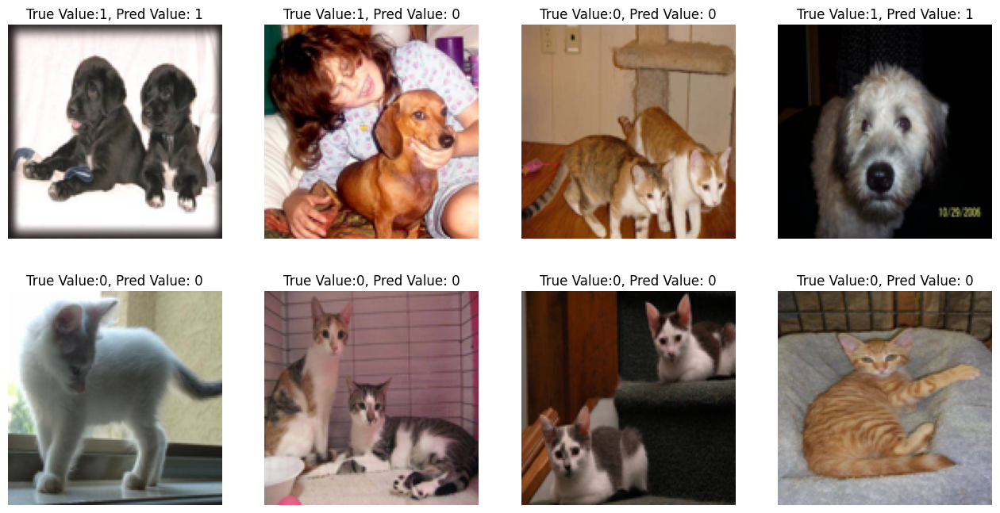

In [ ]:
# Test 데이터로 성능 예측하기

i=1
plt.figure(figsize=(16, 8))
for img, label in zip(X_test[:8], y_test[:8]):
      # 모델 예측(predict)
      pred = model.predict(img.reshape(-1,128, 128, 3))
      pred_t = np.argmax(pred)
      plt.subplot(2, 4, i)
      plt.title(f'True Value:{label}, Pred Value: {pred_t}')
      plt.imshow(img)
      plt.axis('off')
      i = i + 1

## 배운 내용 정리
1. os.listdir과 PIL.Image 활용해서 이미지 Dataset 만들어 보았습니다.
2. os.listdir과 PIL.Image 함수를 이용하여 필요한 데이터를 읽어오고
3. 리스트에 하나씩 넣어주면서 같이 라벨링도 라벨링에 넣어 주었습니다.
4. 이미지 리스트와 라벨 리스트를 numpy array로 변경후 학습 테이더셋과 검증 테이터 셋으로 나눠어 주었습니다.
5. 이후 , CNN 모델을 만들고 학습하고 평가해 보았습니다.
8. 약간의 수작업이 있었는데, 이런식으로 데이터셋 구성 및 모델을 만들수 있었습니다.
9. 추가로 고민할 사항입니다.
  - 검증셋 성능이 높다고 채점 점수가 잘 나올까?
  - CNN 모델을 사용했는데, CNN 모델을 더 깊게 학습하면?
  - 이미지 사이즈를 작게, 아니면 크게 변환해서 하면?
  - 데이터 증강해서 모델을 수행하면?

<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>

#   
# B. image_dataset_from_directory 이용하여 데이터셋 만들기+ CNN 모델

#   
## 1.필요한 라이브러리 임포트

In [ ]:
import os
from glob import glob
from PIL import Image
import zipfile

import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt

#   
## 2.Cats & Dogs 데이터 이미지 파일 가져오기

In [ ]:
# 약 25000 장의 Cats & Dogs 데이터를 사용합니다.
# 아래 데이터 가져오기 그냥 사용합니다.

# !wget --no-check-certificate \
#     "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip" \
#     -O "/tmp/cats-and-dogs.zip"

# local_zip = '/tmp/cats-and-dogs.zip'
# zip_ref = zipfile.ZipFile(local_zip, 'r')
# zip_ref.extractall('/tmp')
# zip_ref.close()

# print(len(os.listdir('/tmp/PetImages/Cat/')))
# print(len(os.listdir('/tmp/PetImages/Dog/')))

In [ ]:
# Cats & Dogs 데이터 파일 다운로드
# train 폴더 : 2000개 데이터
# validation 폴더 : 1000개 데이터

!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip -q -n cats_and_dogs.zip

--2024-08-29 06:45:57--  https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip
Resolving cdn.freecodecamp.org (cdn.freecodecamp.org)... 104.26.2.33, 104.26.3.33, 172.67.70.149, ...
Connecting to cdn.freecodecamp.org (cdn.freecodecamp.org)|104.26.2.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70702765 (67M) [application/zip]
Saving to: ‘cats_and_dogs.zip.3’

cats_and_dogs.zip.3 100%[===================>]  67.43M  55.3MB/s    in 1.2s    

2024-08-29 06:45:59 (55.3 MB/s) - ‘cats_and_dogs.zip.3’ saved [70702765/70702765]



In [ ]:
# 이미지 폴더 밑의 폴더 확인

!ls -l cats_and_dogs

total 12
drwxr-xr-x 2 root root 4096 Jan  9  2020 test
drwxr-x--- 4 root root 4096 Jan  8  2020 train
drwxr-x--- 4 root root 4096 Jan  8  2020 validation


In [ ]:
# train 폴더 안의 이지미 갯수
!ls -l cats_and_dogs/train

total 80
drwxr-x--- 2 root root 36864 Sep 23  2016 cats
drwxr-x--- 2 root root 36864 Sep 23  2016 dogs


In [ ]:
# cats 폴더 안의 이지미 파일들
!ls -l cats_and_dogs/train/cats | grep jpg | head

-rw-r--r-- 1 root root 12414 Sep 20  2013 cat.0.jpg
-rw-r--r-- 1 root root 28377 Sep 20  2013 cat.100.jpg
-rw-r--r-- 1 root root 11291 Sep 20  2013 cat.101.jpg
-rw-r--r-- 1 root root 28635 Sep 20  2013 cat.102.jpg
-rw-r--r-- 1 root root 24853 Sep 20  2013 cat.103.jpg
-rw-r--r-- 1 root root 18941 Sep 20  2013 cat.104.jpg
-rw-r--r-- 1 root root  6159 Sep 20  2013 cat.105.jpg
-rw-r--r-- 1 root root 20232 Sep 20  2013 cat.106.jpg
-rw-r--r-- 1 root root 23076 Sep 20  2013 cat.107.jpg
-rw-r--r-- 1 root root 24431 Sep 20  2013 cat.108.jpg


In [ ]:
# cats 폴더 안의 이지미 파일 갯수
!ls -l cats_and_dogs/train/cats | grep jpg | wc -l

1000


#   
##  3. 이미지 파일 하나 읽어 이미지 보기

In [ ]:
# 이미지 패스 지정
cat_path = 'cats_and_dogs/train/cats/'

In [ ]:
# 이미지 패스의 파말 리스트 만들기
cat_file = os.listdir(cat_path)

In [ ]:
# 이미지 파일 리스트 읽어보기
cat_file[:2]

['cat.838.jpg', 'cat.912.jpg']

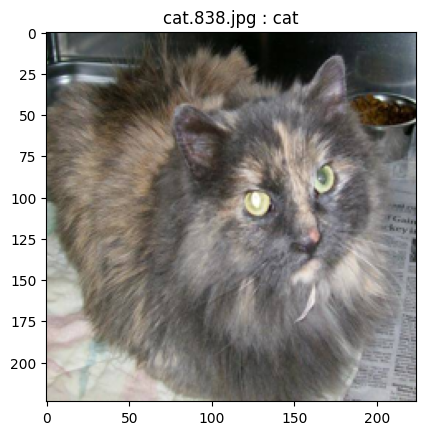

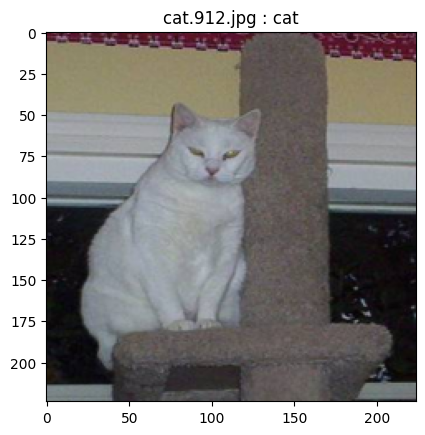

In [ ]:
# 위의 파일 리스트에서 2개씩 읽고 이미지 출력하기
for img_file in cat_file[:2] :
    img = Image.open(cat_path + img_file).resize((224,224))
    plt.title(img_file + ' : cat')
    plt.imshow(img)
    plt.show()


#    
## 4. Data Preprocess

### image_dataset_from_directory 이용하여 자동으로 이미지 데이터셋 생성, 라벨링 한꺼번에 처리 할수 있다.

In [ ]:
# 하이터 파라미터 정의
input_shape = (128, 128, 3)
batch_size = 32
num_classes = 5

In [ ]:
# 이미지 패스 지정
train_img_path ='/content/cats_and_dogs/train'
valid_img_path ='/content/cats_and_dogs/validation'

In [ ]:
# image_dataset_from_directory 함수 활용하여
# 이미지 폴더 밑의 이미지들에 대해 원핫인코딩된 labeling수행, 이미지 배치, 셔플 수행

# Train Dataset 만들기
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
                                             directory=train_img_path,
                                             label_mode="categorical",   # binary , categorical
                                             batch_size=batch_size,
                                             image_size=(128, 128),      # 사이즈 확인
                                             seed=42,
                                             shuffle=True,
                                            #  validation_split=0.2,
                                            #  subset="training"    # One of "training" or "validation". Only used if validation_split is set.
                                            )

# Test Dataset 만들기
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
                                             directory=valid_img_path,
                                             label_mode="categorical",   # binary , categorical
                                             batch_size=batch_size,
                                             image_size=(128, 128),      # 사이즈 확인
                                             seed=42,
                                            #  validation_split=0.2,
                                            #  subset="validation"    # One of "training" or "validation". Only used if validation_split is set.
                                            )

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


In [ ]:
# Class 이름 확인
train_ds.class_names

['cats', 'dogs']

In [ ]:
batch_img, batch_label = next(iter(train_ds))
batch_img.shape, batch_label.shape

(TensorShape([32, 128, 128, 3]), TensorShape([32, 2]))

(128, 128, 3)


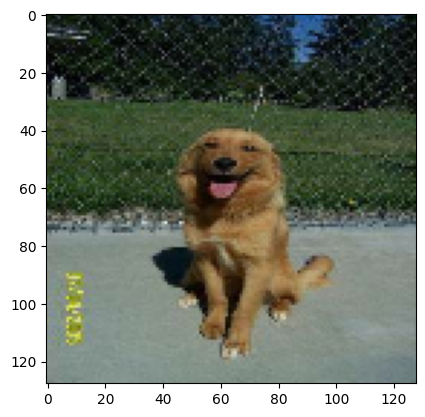

In [ ]:
# 샘플 이미지 확인

i = 0
for batch_img, batch_label in train_ds.take(1):
  if i == 0 :
    print(batch_img[i].shape)
    plt.imshow(batch_img[i]/255)
  i = i + 1


#   
## 5. Build Model

In [ ]:
# Hyperparameter Tunning

num_epochs = 10
batch_size = 32

learning_rate = 0.001
dropout_rate = 0.5

input_shape = (128, 128, 3)  # 사이즈 확인
num_classes = 5

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Rescaling

model = Sequential()
model.add(Rescaling(1. / 255))  # 이미지 Rescaling. 없이 하면 성능이 안나옴.
model.add(Conv2D(32, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Conv2D(64,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(64,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(128,(3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(2, activation='softmax'))



In [ ]:
# Model compile
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),  # Optimization
              loss='categorical_crossentropy',  # Loss Function
              metrics=['accuracy'])  # Metrics / Accuracy

In [ ]:
# callbacks

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# EarlyStopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)

# ModelCheckpoint
checkpoint_path = "my_checkpoint.keras"
checkpoint = ModelCheckpoint(filepath=checkpoint_path,
                             save_best_only=True,
                             monitor='val_loss',
                             verbose=1)

In [ ]:
# 모델 학습(fit) : 70% 성능
# image_dataset_from_directory 이용하여 데이터 만들었을때 아래와 같이 학습 진행
# num_epochs = 10

history = model.fit(
    train_ds,
    validation_data=(test_ds),
    epochs=10,
    callbacks=[es, checkpoint]
)

Epoch 1/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5135 - loss: 0.7107
Epoch 1: val_loss improved from inf to 0.69349, saving model to my_checkpoint.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - accuracy: 0.5136 - loss: 0.7105 - val_accuracy: 0.5000 - val_loss: 0.6935
Epoch 2/10
61/63 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.5277 - loss: 0.6935
Epoch 2: val_loss did not improve from 0.69349
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.5281 - loss: 0.6934 - val_accuracy: 0.5010 - val_loss: 0.6948
Epoch 3/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5491 - loss: 0.6893
Epoch 3: val_loss improved from 0.69349 to 0.66672, saving model to my_checkpoint.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.5491 - loss: 0.6893 - val_accuracy: 0.6060 - val_loss: 0.6667
Epoch 4/10
62/63 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5479 - loss: 0.6808
Epoch 4: val_loss improved from 0.66672 to 0.66510, saving model to my_checkpoint.keras
63/

#   
## 6. Predict

In [ ]:
# 배치사이즈 이미지/라벨 가져오기
batch_img , batch_label = next(iter(test_ds))
type(batch_img), batch_img.shape

(tensorflow.python.framework.ops.EagerTensor, TensorShape([32, 128, 128, 3]))

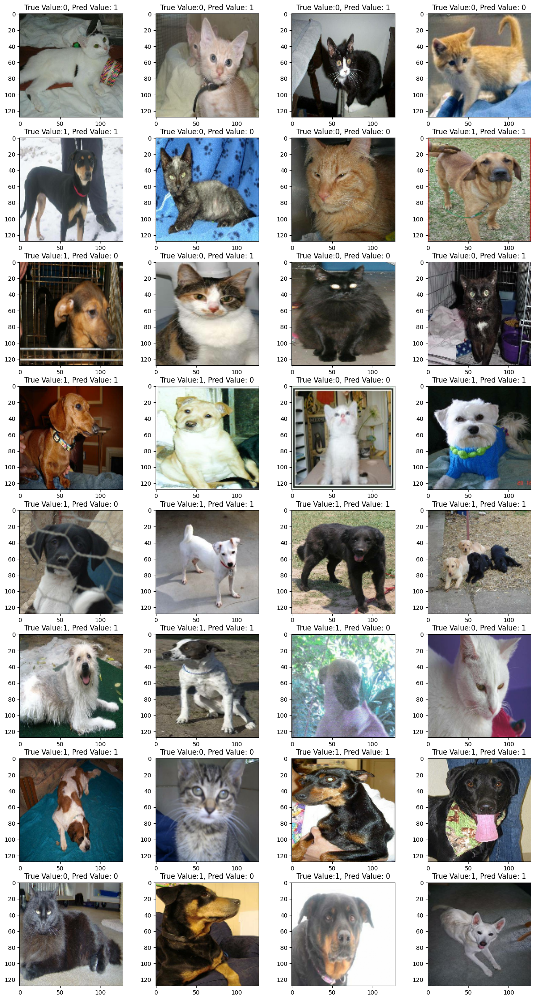

In [ ]:
# Test 데이터로 성능 예측하기

i = 1
plt.figure(figsize=(16, 30))
for img, label in list(zip(batch_img, batch_label)):
    pred = model.predict(img.numpy().reshape(-1, 128,128,3), verbose=0)
    pred_t = np.argmax(pred)
    plt.subplot(8, 4, i)
    plt.title(f'True Value:{np.argmax(label)}, Pred Value: {pred_t}')
    plt.imshow(img/255)  # 이미지 픽셀값들이 실수형이므로 0~1 사이로 변경해야 에러 안남
    i = i + 1


## 배운 내용 정리
1. DataSet을 만들기 위해 많은 수작업(파일 읽어오기, Pipeline(map, cache, batch, shuffle, prefetch), 라벨 코딩등) 필요
2. 이런 수작업을 케라스 image_dataset_from_directory 이용하여 한번에 처리할수 있습니다.
3. 여러분은 image_dataset_from_directory 와 같은 필요한 함수들을 필요에 따라 잘 사용하시면 되겠습니다.
4. 추가로 고민할 사항입니다.
  - 검증셋 성능이 높다고 채점 점수가 잘 나올까?
  - CNN 모델을 사용했는데, CNN 모델을 더 깊게 학습하면?
  - 이미지 사이즈를 작게, 아니면 크게 변환해서 하면?
  - 데이터 증강해서 모델을 수행하면?

<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>

#   
# C. MobileNet Transfer Learning & Fine-tuning 모델링

#    
## 1. Build Model

In [ ]:
# 케라스 applicatioins에 어떤 종류의 모델 있는지 확인
dir(tf.keras.applications)

['ConvNeXtBase',
 'ConvNeXtLarge',
 'ConvNeXtSmall',
 'ConvNeXtTiny',
 'ConvNeXtXLarge',
 'DenseNet121',
 'DenseNet169',
 'DenseNet201',
 'EfficientNetB0',
 'EfficientNetB1',
 'EfficientNetB2',
 'EfficientNetB3',
 'EfficientNetB4',
 'EfficientNetB5',
 'EfficientNetB6',
 'EfficientNetB7',
 'EfficientNetV2B0',
 'EfficientNetV2B1',
 'EfficientNetV2B2',
 'EfficientNetV2B3',
 'EfficientNetV2L',
 'EfficientNetV2M',
 'EfficientNetV2S',
 'InceptionResNetV2',
 'InceptionV3',
 'MobileNet',
 'MobileNetV2',
 'MobileNetV3Large',
 'MobileNetV3Small',
 'NASNetLarge',
 'NASNetMobile',
 'ResNet101',
 'ResNet101V2',
 'ResNet152',
 'ResNet152V2',
 'ResNet50',
 'ResNet50V2',
 'VGG16',
 'VGG19',
 'Xception',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'convnext',
 'densenet',
 'efficientnet',
 'efficientnet_v2',
 'imagenet_utils',
 'inception_resnet_v2',
 'inception_v3',
 'mobilenet',
 'mobilenet_v2',
 'mobilenet_v3',
 'nas

In [ ]:
# 사전 훈련된 모델 MobileNetV2에서 기본 모델을 생성합니다.
# 아래와 같은 형식을 MobileNetV2 Transfer Learning 사용하며 됩니다.

base_model = tf.keras.applications.MobileNetV2(input_shape=(128, 128, 3), weights='imagenet', include_top=False)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 64, 64, 32)     │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 64, 64, 32)     │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 64, 64, 32)     │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 64, 64, 32)     │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 64, 64, 16)     │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 64, 64, 16)     │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 64, 64, 96)     │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 64, 64, 96)     │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 64, 64, 96)     │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 65, 65, 96)     │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 32, 32, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
# tf.keras.applications.MobileNetV2 모델은 [-1, 1]의 픽셀 값을 예상하지만 이 시점에서 이미지의 픽셀 값은 [0, 255]입니다.
# MobileNetV2 모델에서 제대로 수행하기 위해 크기를 [-1, 1]로 재조정해야 합니다.(안하고 수행해도 성능 잘 나옴)
# 방법 2가지 있음
# 첫번째 방법 : preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
# 두번째 방법 : rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

In [ ]:
# MobileNet V2 베이스 모델 고정하기
base_model.trainable = False

In [ ]:
# 모델 구축 : 이미지 픽셀값 조정 수행하기(Rescaling) --> 성능 더 잘 나옴.

inputs = tf.keras.Input(shape=(128, 128, 3))
x = tf.keras.layers.Rescaling(1./127.5, offset=-1)(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)  # 3차원(7, 7, 1280) --> 1차원(1280)으로 줄이기 : GlobalAveragePooling2D
output = tf.keras.layers.Dense(2, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=output)
model.summary()

Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_2 (Rescaling)              │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_128 (Functional)    │ (None, 4, 4, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 2)                   │           2,562 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,260,546 (8.62 MB)

 Trainable params: 2,562 (10.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# 모델 compile

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),  # Optimization
              loss='categorical_crossentropy',  # Loss Function
              metrics=['accuracy'])             # Metrics / Accuracy

In [ ]:
# callbacks
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# EarlyStopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)

# ModelCheckpoint
checkpoint_path = "my_checkpoint.keras"
checkpoint = ModelCheckpoint(filepath=checkpoint_path,
                             save_best_only=True,
                             monitor='val_loss',
                             verbose=1)

In [ ]:
# MobileNetV2 전이학습으로 모델 학습 : 97% 성능
# image_dataset_from_directory 이용하여 DataSet을 만들었으며
# num_epochs = 10
# batch_size = 32

history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs=2,
    callbacks=[es, checkpoint]
)

Epoch 1/2
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8313 - loss: 0.3482
Epoch 1: val_loss improved from inf to 0.08774, saving model to my_checkpoint.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 197ms/step - accuracy: 0.8327 - loss: 0.3457 - val_accuracy: 0.9660 - val_loss: 0.0877
Epoch 2/2
61/63 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9687 - loss: 0.0797
Epoch 2: val_loss improved from 0.08774 to 0.07175, saving model to my_checkpoint.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.9688 - loss: 0.0794 - val_accuracy: 0.9730 - val_loss: 0.0717


#   
## 2. Predict

In [ ]:
# test_generator 샘플 데이터 가져오기
# 배치 사이즈 32 확인

batch_img, batch_label = next(iter(test_ds))
print(batch_img.shape)
print(batch_label.shape)

(32, 128, 128, 3)
(32, 2)


In [ ]:
# 이미지 rescale 되어 있는 상태
batch_img[0][0][:10]

<tf.Tensor: shape=(10, 3), dtype=float32, numpy=
array([[52.531418, 45.531418, 37.531418],
       [47.64012 , 40.64012 , 32.64012 ],
       [43.711777, 36.711777, 28.711777],
       [48.710938, 41.710938, 33.710938],
       [47.05078 , 42.964844, 31.921875],
       [49.929688, 42.871094, 27.046875],
       [49.48047 , 43.320312, 27.320312],
       [32.35547 , 32.308594, 24.046875],
       [17.183594, 14.910156,  9.910156],
       [44.15944 , 42.15944 , 28.55397 ]], dtype=float32)>

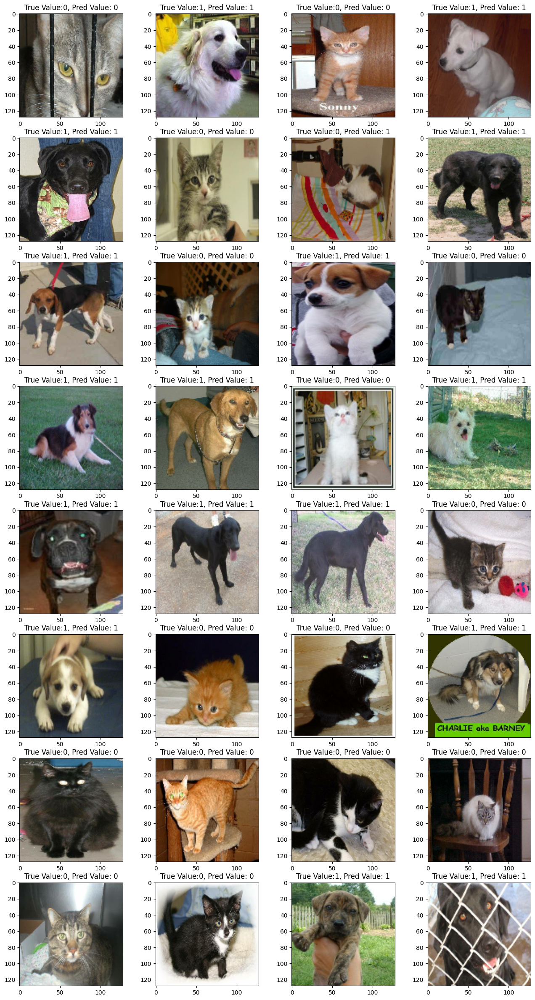

In [ ]:
# 100% 성능 보여줌

i = 1
plt.figure(figsize=(16, 30))
for img, label in list(zip(batch_img, batch_label)):
    pred = model.predict(img.numpy().reshape(-1, 128,128,3), verbose=0)
    pred_t = np.argmax(pred)
    plt.subplot(8, 4, i)
    plt.title(f'True Value:{np.argmax(label)}, Pred Value: {pred_t}')
    plt.imshow(img/255)  # 이미지 픽셀값들이 실수형이므로 0~1 사이로 변경해야 에러 안남
    i = i + 1

## 배운 내용 정리
1. Transfer Learning을 사용하는 방법을 배웠으며 이를 통해 성능을 올릴수 있었습니다.
2. Cats & Dogs 이미지 데이터에 대해서 Transfer Learning 적용하여 95% 높은 성능을 발휘했습니다.
3. 여러분도 Transfer Learning을 사용하는 방법을 숙지해서 이용할수 있으면 좋겠네요.
4. 추가로 고민할 사항입니다.
  - 검증셋 성능이 높다고 채점 점수가 잘 나올까?
  - mobilenetv2 모델을 사용했는데, 다른 모델로 학습해 보면?
  - 데이터 증강해서 모델을 학습해 보면 ?
  - 150개의 레이어가 있다고 가정하고 그중 뒤쪽 30개 레이어만 따로 학습하는 미세 조정 학습은? 성능이 더 좋아질까?
